<a href="https://colab.research.google.com/github/RasikhTariq/machinelearning/blob/main/Article2_StudentStressLevel_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# Mount Google Drive if the file is stored there
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# Mount Google Drive if the file is stored there
from google.colab import drive
drive.mount('/content/drive')

# Load the data from the Excel file
file_path = '/content/drive/MyDrive/Colab Notebooks/2024-2025- Student Stress Level/StressLevelDataset.csv'
# Load the dataset

df = pd.read_csv(file_path)
df

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,anxiety_level,self_esteem,mental_health_history,depression,headache,blood_pressure,sleep_quality,breathing_problem,noise_level,living_conditions,...,basic_needs,academic_performance,study_load,teacher_student_relationship,future_career_concerns,social_support,peer_pressure,extracurricular_activities,bullying,stress_level
0,14,20,0,11,2,1,2,4,2,3,...,2,3,2,3,3,2,3,3,2,1
1,15,8,1,15,5,3,1,4,3,1,...,2,1,4,1,5,1,4,5,5,2
2,12,18,1,14,2,1,2,2,2,2,...,2,2,3,3,2,2,3,2,2,1
3,16,12,1,15,4,3,1,3,4,2,...,2,2,4,1,4,1,4,4,5,2
4,16,28,0,7,2,3,5,1,3,2,...,3,4,3,1,2,1,5,0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,11,17,0,14,3,1,3,2,2,2,...,3,2,2,2,3,3,2,3,3,1
1096,9,12,0,8,0,3,0,0,0,1,...,4,0,1,1,1,1,3,4,3,2
1097,4,26,0,3,1,2,5,2,2,3,...,4,5,1,4,1,3,1,2,1,0
1098,21,0,1,19,5,3,1,4,3,1,...,1,2,5,1,4,1,4,4,4,2


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Header:
   anxiety_level  self_esteem  mental_health_history  depression  headache  \
0             14           20                      0          11         2   
1             15            8                      1          15         5   
2             12           18                      1          14         2   
3             16           12                      1          15         4   
4             16           28                      0           7         2   

   blood_pressure  sleep_quality  breathing_problem  noise_level  \
0               1              2                  4            2   
1               3              1                  4            3   
2               1              2                  2            2   
3               3              1                  3            4   
4               3              5                  1   

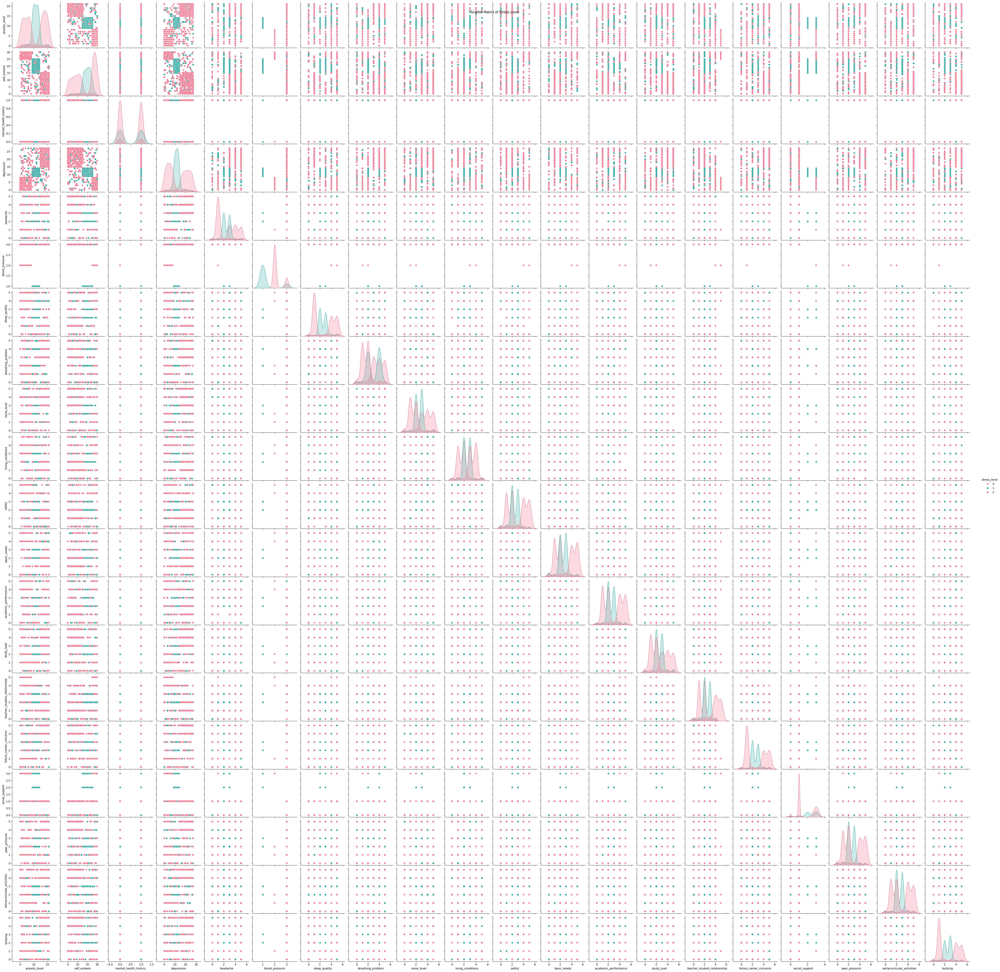

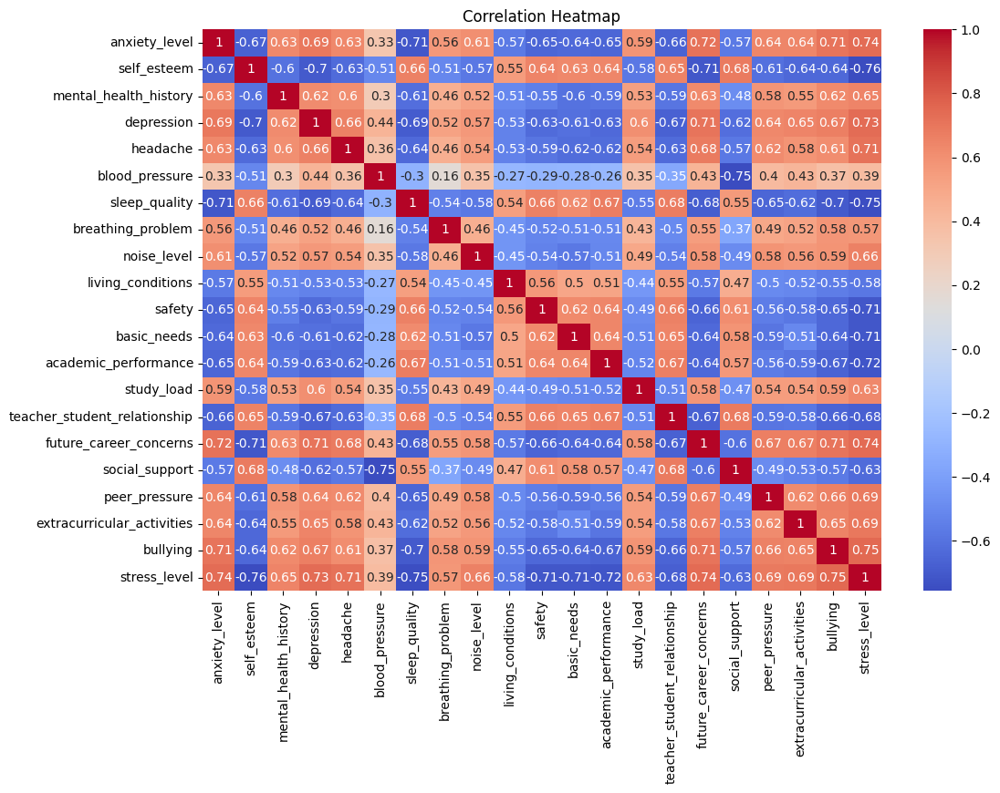

In [2]:


# Show the header and dataframe
print("Header:")
print(df.head())

# Scatter matrix
scatter_matrix = sns.pairplot(df, hue='stress_level', markers=["o", "s", "D"], palette="husl")
plt.suptitle("Scatter Matrix of Stress Level")
plt.show()

# Correlation heatmap
correlation_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()


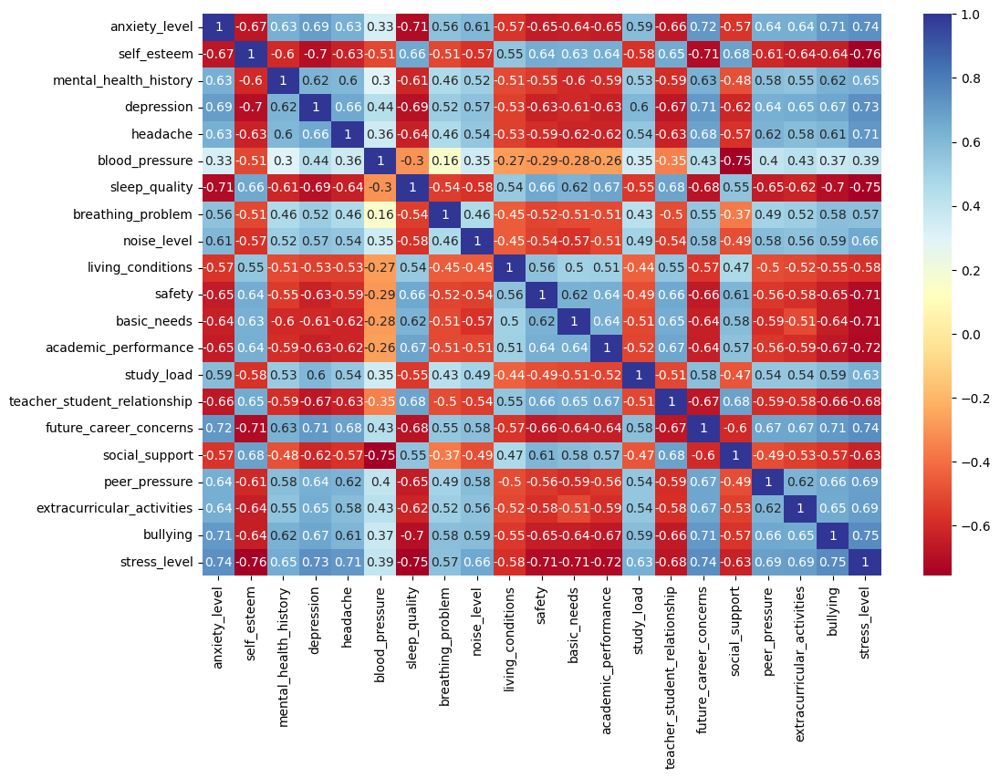

In [3]:
# Correlation heatmap
correlation_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="RdYlBu")
plt.show()

In [5]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Exclude the dependent variable
X = df.drop(columns=['stress_level'])

# Add constant for intercept
X = add_constant(X)

# Compute VIF for each feature
vif = pd.DataFrame()
vif["Feature"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display VIF values
print(vif)


                         Feature         VIF
0                          const  139.636943
1                  anxiety_level    3.226378
2                    self_esteem    3.208365
3          mental_health_history    2.218410
4                     depression    3.090505
5                       headache    2.534846
6                 blood_pressure    3.686664
7                  sleep_quality    3.089081
8              breathing_problem    1.784443
9                    noise_level    1.990095
10             living_conditions    1.797776
11                        safety    2.790136
12                   basic_needs    2.679847
13          academic_performance    2.706926
14                    study_load    1.900661
15  teacher_student_relationship    3.198274
16        future_career_concerns    3.416580
17                social_support    5.745766
18                 peer_pressure    2.606810
19    extracurricular_activities    2.516038
20                      bullying    3.187411


In [3]:
vif

NameError: name 'vif' is not defined

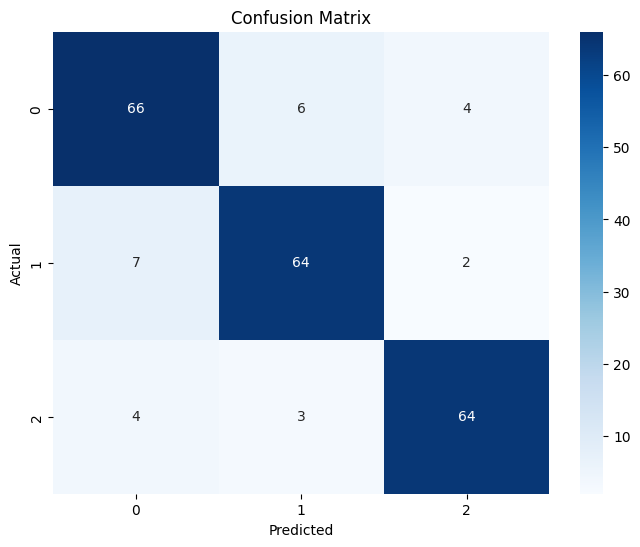

Confusion Matrix and Classification Report saved to Excel files.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the Logistic Regression model
logistic_regression_model = LogisticRegression(max_iter=1000)
logistic_regression_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = logistic_regression_model.predict(X_test_scaled)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])

# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report.xlsx')

# Display the results
print("Classification Report saved to Excel files.")


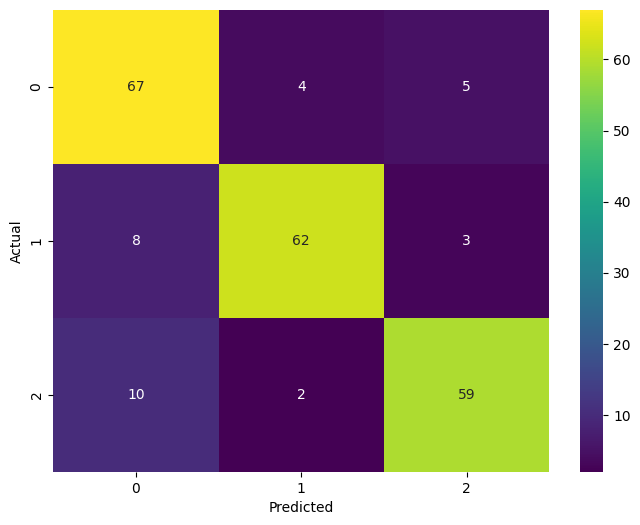

Classification Report saved to Excel files.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the SVM model
svm_model = SVC()
svm_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = svm_model.predict(X_test_scaled)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="viridis", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])
# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report_svm.xlsx')

# Display the results
print("Classification Report saved to Excel files.")


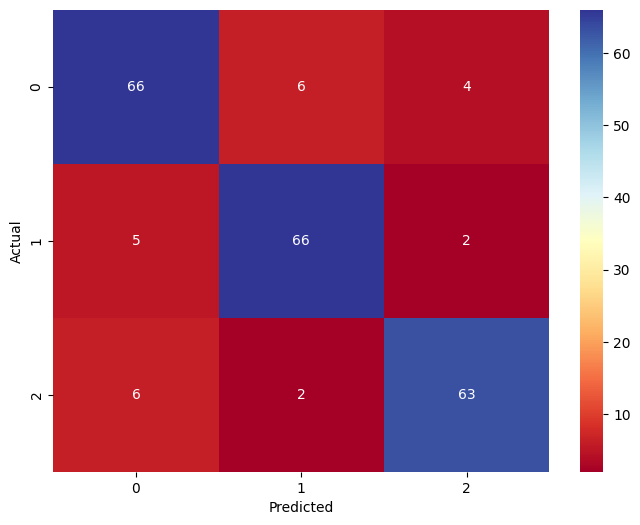

Classification Report saved to Excel files.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier  # Change this line
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the Gradient Boosting model
gb_model = GradientBoostingClassifier()  # Change this line
gb_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = gb_model.predict(X_test_scaled)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="RdYlBu", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])
confusion_matrix_df.to_excel('/content/drive/MyDrive/Colab Notebooks/confusion_matrix_gb.xlsx')  # Change this line

# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report_gb.xlsx')  # Change this line

# Display the results
print("Classification Report saved to Excel files.")


Epoch 1/10
28/28 [==============================] - 2s 19ms/step - loss: -0.6788 - accuracy: 0.4284 - val_loss: -2.2945 - val_accuracy: 0.6136
Epoch 2/10
28/28 [==============================] - 0s 9ms/step - loss: -5.0855 - accuracy: 0.5500 - val_loss: -8.8124 - val_accuracy: 0.5364
Epoch 3/10
28/28 [==============================] - 0s 8ms/step - loss: -15.6671 - accuracy: 0.4943 - val_loss: -23.6947 - val_accuracy: 0.5000
Epoch 4/10
28/28 [==============================] - 0s 11ms/step - loss: -37.1359 - accuracy: 0.4943 - val_loss: -52.3743 - val_accuracy: 0.4909
Epoch 5/10
28/28 [==============================] - 0s 8ms/step - loss: -76.6439 - accuracy: 0.4830 - val_loss: -100.4926 - val_accuracy: 0.5409
Epoch 6/10
28/28 [==============================] - 0s 8ms/step - loss: -140.1389 - accuracy: 0.4864 - val_loss: -177.1214 - val_accuracy: 0.5364
Epoch 7/10
28/28 [==============================] - 0s 7ms/step - loss: -236.9032 - accuracy: 0.4852 - val_loss: -286.7201 - val_accura

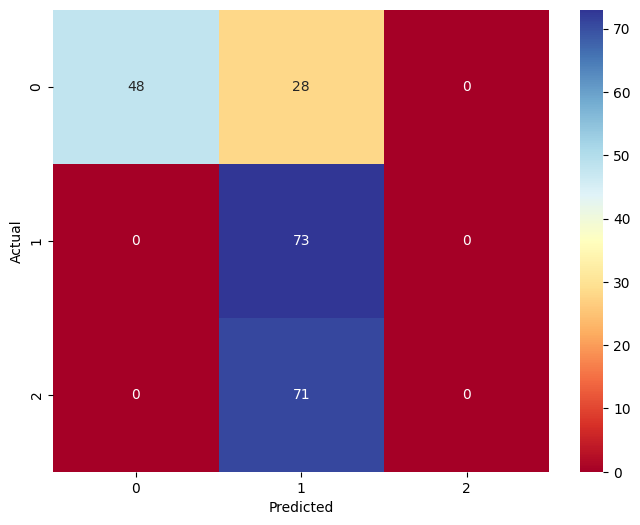

Classification Report saved to Excel files.


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Reshape the data for CNN input (assuming X has a 2D shape)
X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

# Create and train the CNN model
cnn_model = Sequential()
cnn_model.add(Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)))
cnn_model.add(MaxPooling1D(pool_size=2))
cnn_model.add(Flatten())
cnn_model.add(Dense(50, activation='relu'))
cnn_model.add(Dense(1, activation='sigmoid'))  # Assuming binary classification

cnn_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

cnn_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32, validation_data=(X_test_reshaped, y_test))

# Make predictions on the test set
y_pred_proba = cnn_model.predict(X_test_reshaped)
y_pred = (y_pred_proba > 0.5).astype(int)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="RdYlBu", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])
confusion_matrix_df.to_excel('/content/drive/MyDrive/Colab Notebooks/confusion_matrix_cnn.xlsx')

# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report_cnn.xlsx')

# Display the results
print("Classification Report saved to Excel files.")


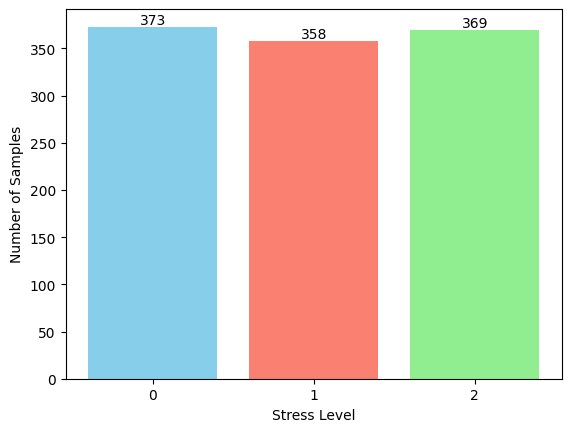

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Define attractive colors
colors = ['skyblue', 'salmon', 'lightgreen']

# Plot the distribution of stress_level classes
class_counts = df['stress_level'].value_counts().sort_index()
classes = class_counts.index
counts = class_counts.values

plt.bar(classes, counts, color=colors, label='Stress Level')
plt.xlabel('Stress Level')
plt.ylabel('Number of Samples')

# Add labels to each bar
for i, count in enumerate(counts):
    plt.text(classes[i], count + 0.1, str(count), ha='center', va='bottom', color='black')

# Set x-axis ticks to show only 0, 1, and 2
plt.xticks(classes)

plt.show()


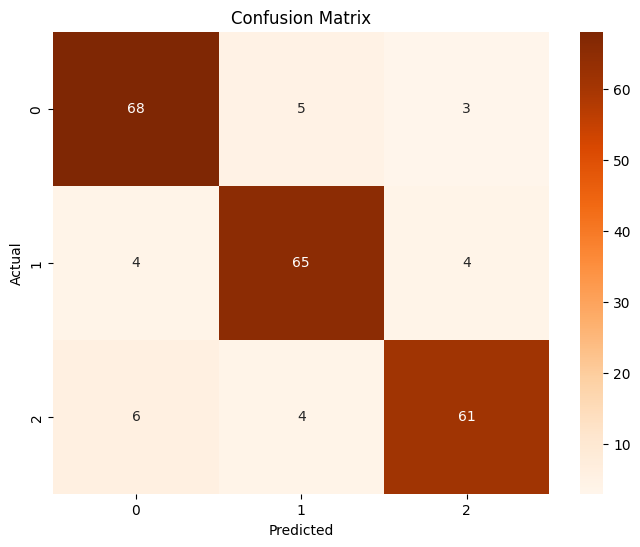

Classification Report saved to Excel files.


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = dt_model.predict(X_test_scaled)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Oranges", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])
confusion_matrix_df.to_excel('/content/drive/MyDrive/Colab Notebooks/confusion_matrix_dt.xlsx')

# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report_dt.xlsx')

# Display the results
print("Classification Report saved to Excel files.")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 5.4 MB/s eta 0:00:00


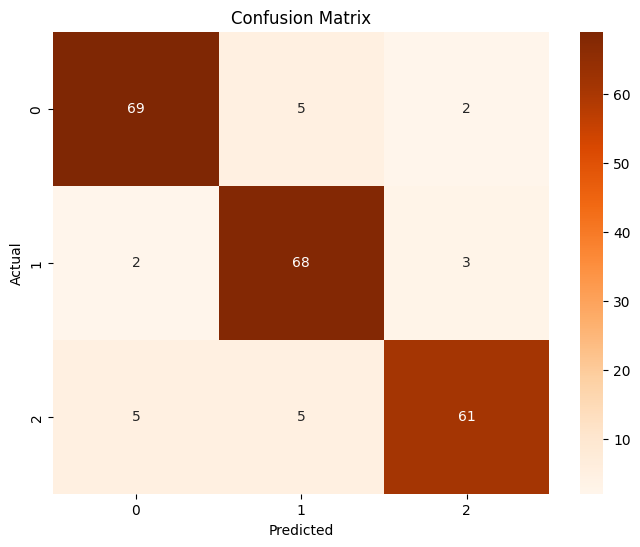

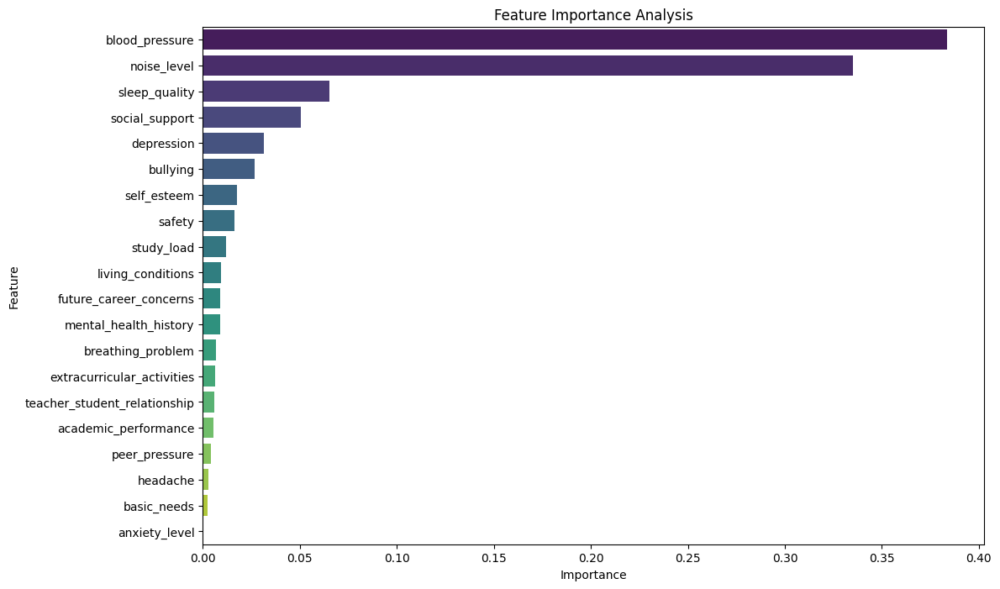

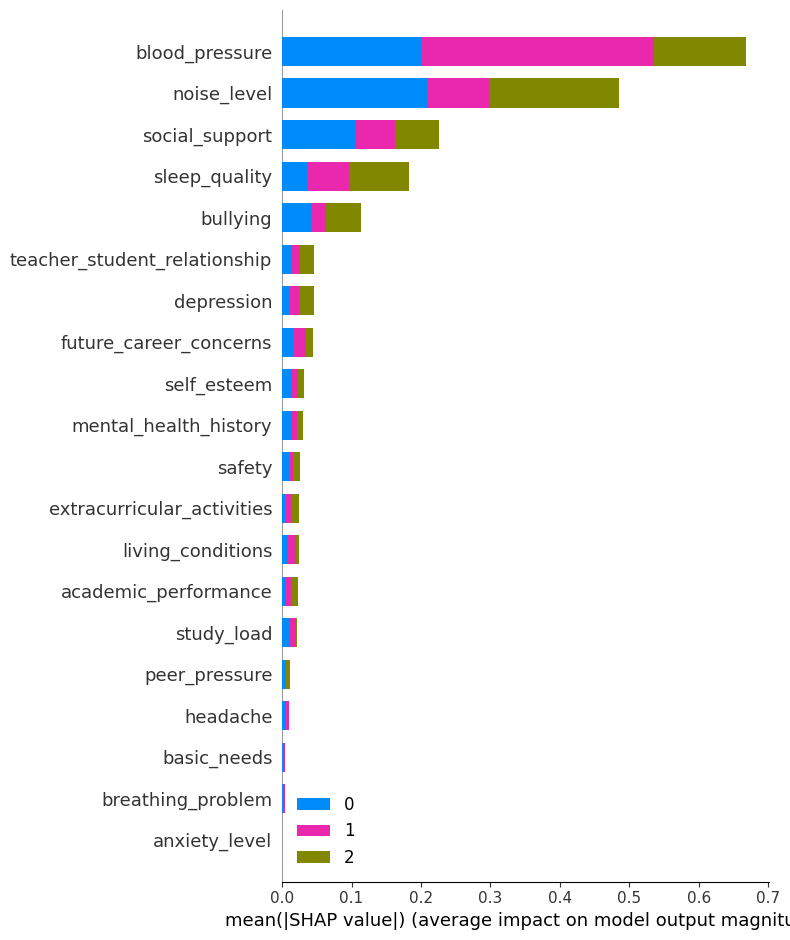

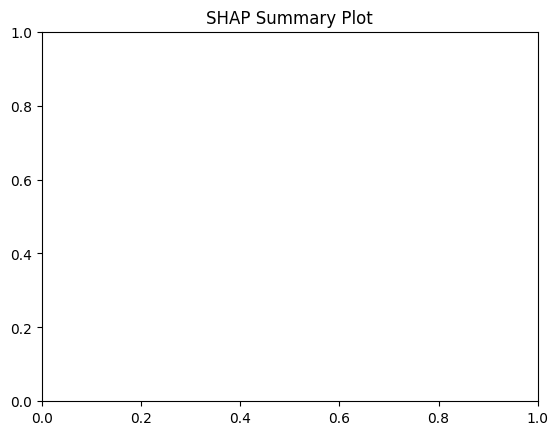

Classification Report and Feature Importance saved to Excel files.


In [ ]:
!pip install shap
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import shap

# Load the dataset
file_path = '/content/drive/MyDrive/Colab Notebooks/StressLevelDataset.csv'
df = pd.read_csv(file_path)

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
y_pred = dt_model.predict(X_test_scaled)

# Plot the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Oranges", xticklabels=['0', '1', '2'], yticklabels=['0', '1', '2'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Save the confusion matrix to Excel
confusion_matrix_df = pd.DataFrame(conf_matrix, index=['0', '1', '2'], columns=['0', '1', '2'])
confusion_matrix_df.to_excel('/content/drive/MyDrive/Colab Notebooks/confusion_matrix_dt.xlsx')

# Save the classification report to an Excel file
classification_report_df = pd.DataFrame(classification_report(y_test, y_pred, output_dict=True)).transpose()
classification_report_df.to_excel('/content/drive/MyDrive/Colab Notebooks/classification_report_dt.xlsx')

# Feature Importance Analysis
feature_importance = dt_model.feature_importances_

# Create a DataFrame to display feature importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importance Analysis')
plt.show()

# SHAP Analysis
explainer = shap.TreeExplainer(dt_model)
shap_values = explainer.shap_values(X_test_scaled)

# Summary plot of SHAP values
shap.summary_plot(shap_values, X_test, feature_names=X.columns, class_names=['0', '1', '2'])
plt.title('SHAP Summary Plot')
plt.show()

# Display the results
print("Classification Report and Feature Importance saved to Excel files.")



Fitting 5 folds for each of 5250 candidates, totalling 26250 fits
Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_samples_leaf': 6, 'min_samples_split': 20}

Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.89      0.88        76
           1       0.85      0.86      0.86        73
           2       0.90      0.85      0.87        71

    accuracy                           0.87       220
   macro avg       0.87      0.87      0.87       220
weighted avg       0.87      0.87      0.87       220



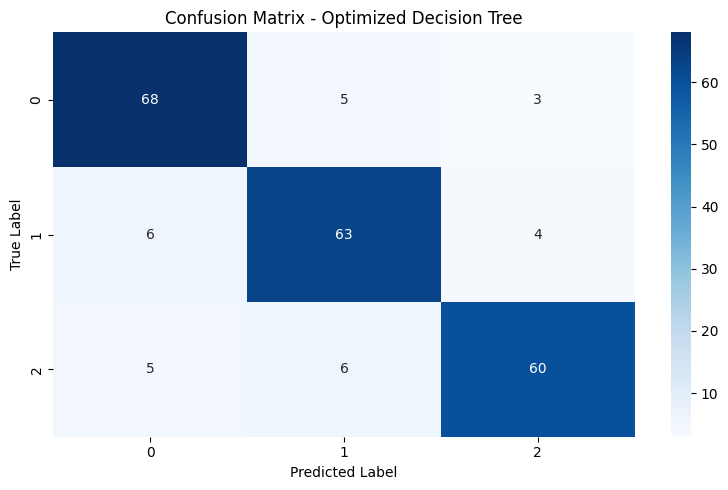

In [4]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base Decision Tree model
dtree = DecisionTreeClassifier(random_state=42)

# Hyperparameter grid for tuning
param_grid = {
    'max_depth': [3, 5, 10, 15, 20, 25, None],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_features': [None, 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30, 40],
    'criterion': ['gini', 'entropy']
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=dtree,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()


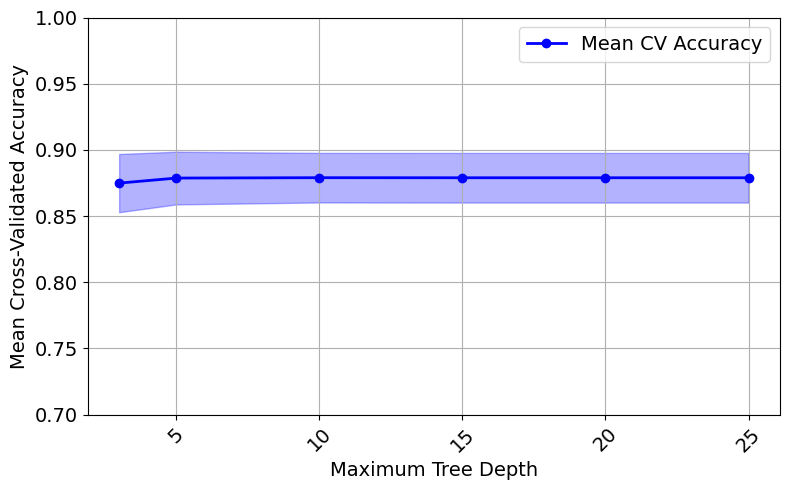

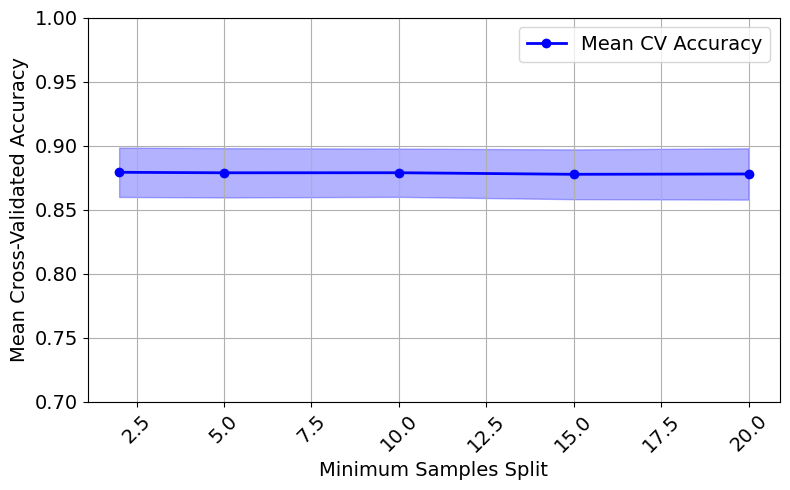

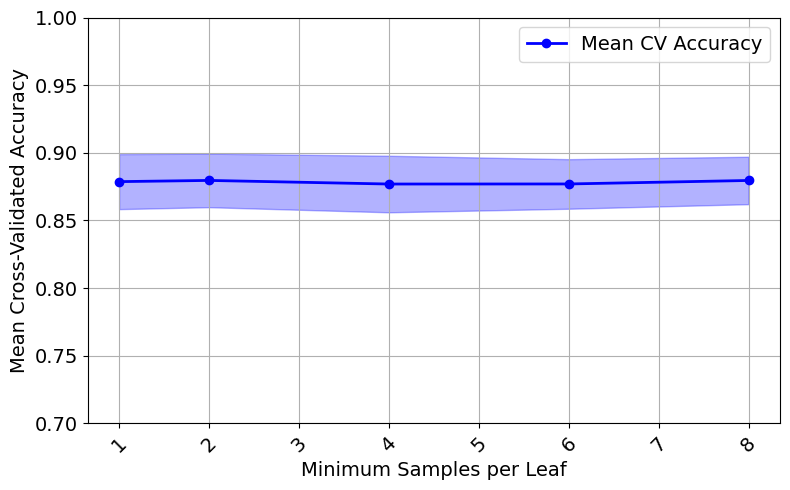

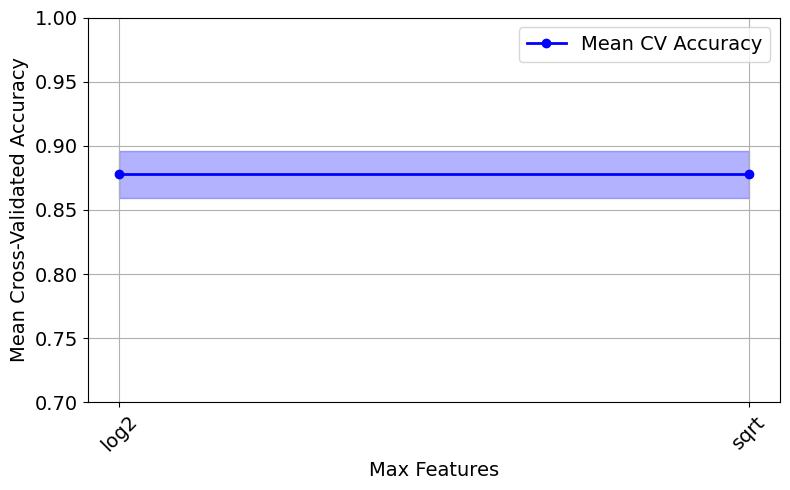

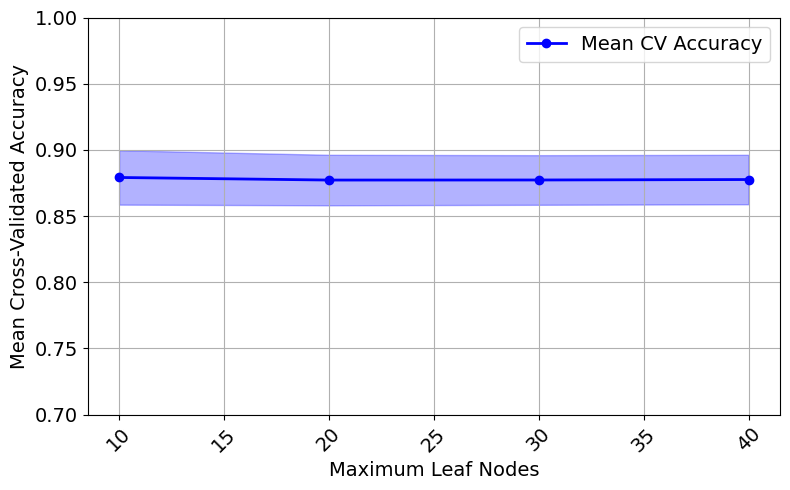

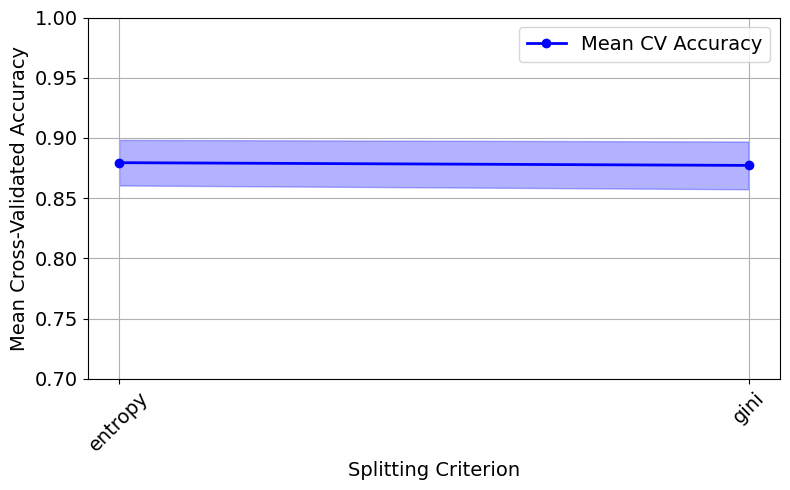

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Extract GridSearchCV results
results = pd.DataFrame(grid_search.cv_results_)

# Define the parameters to plot
param_names = [
    'param_max_depth',
    'param_min_samples_split',
    'param_min_samples_leaf',
    'param_max_features',
    'param_max_leaf_nodes',
    'param_criterion'
]

# Mapping for pretty axis labels
label_map = {
    'param_max_depth': 'Maximum Tree Depth',
    'param_min_samples_split': 'Minimum Samples Split',
    'param_min_samples_leaf': 'Minimum Samples per Leaf',
    'param_max_features': 'Max Features',
    'param_max_leaf_nodes': 'Maximum Leaf Nodes',
    'param_criterion': 'Splitting Criterion'
}

# Loop over each parameter and generate a plot
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Convert to float if possible for proper sorting
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="blue", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="blue")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.7, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()


Fitting 5 folds for each of 120 candidates, totalling 600 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
150 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
85 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/utils

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0, 'penalty': 'l1'}

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91        76
           1       0.93      0.86      0.89        73
           2       0.86      0.92      0.88        71

    accuracy                           0.90       220
   macro avg       0.90      0.90      0.90       220
weighted avg       0.90      0.90      0.90       220



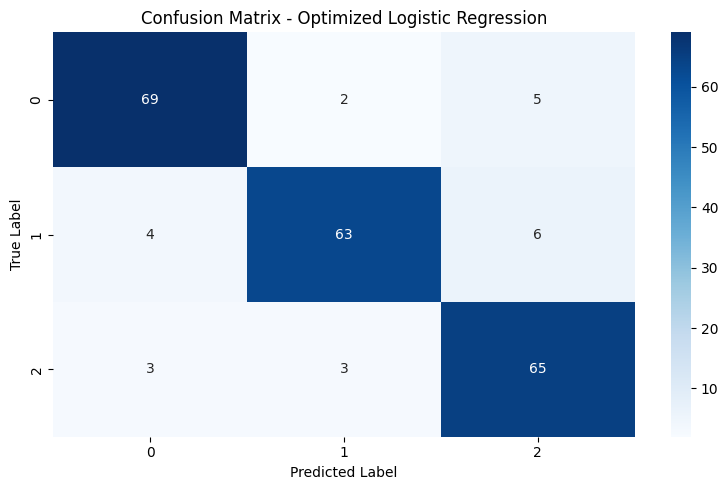

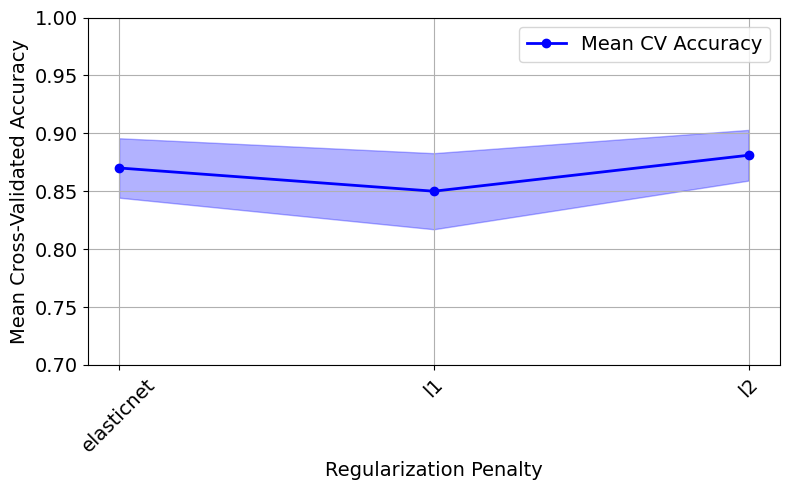

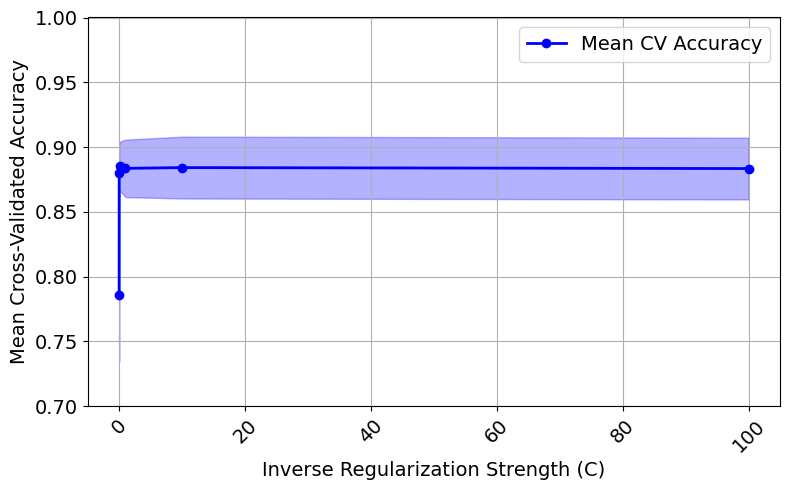

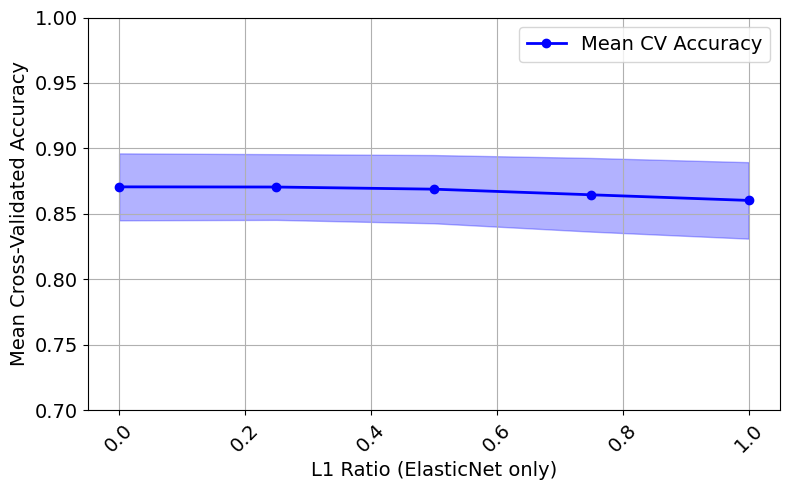

In [8]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base Logistic Regression model
logreg = LogisticRegression(solver='saga', max_iter=10000, random_state=42, multi_class='multinomial')

# Hyperparameter grid for tuning
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'l1_ratio': [0, 0.25, 0.5, 0.75, 1],  # Only used if penalty='elasticnet'
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ---------------------- Validation Curve Plots ----------------------

# Extract GridSearchCV results
results = pd.DataFrame(grid_search.cv_results_)

# Define the parameters to plot
param_names = ['param_penalty', 'param_C', 'param_l1_ratio']

# Mapping for pretty axis labels
label_map = {
    'param_penalty': 'Regularization Penalty',
    'param_C': 'Inverse Regularization Strength (C)',
    'param_l1_ratio': 'L1 Ratio (ElasticNet only)'
}

# Loop over each parameter and generate a plot
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Convert to float if possible for proper sorting
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="blue", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="blue")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.7, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_logreg_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()




Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Hyperparameters: {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.88      0.88        76
           1       0.88      0.90      0.89        73
           2       0.91      0.89      0.90        71

    accuracy                           0.89       220
   macro avg       0.89      0.89      0.89       220
weighted avg       0.89      0.89      0.89       220



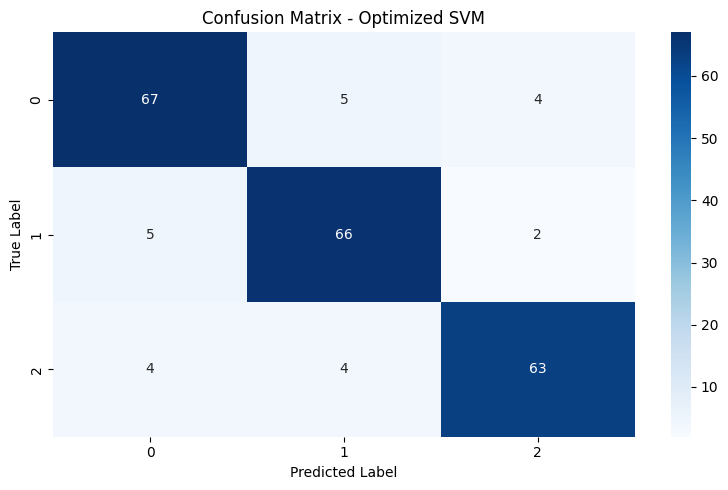

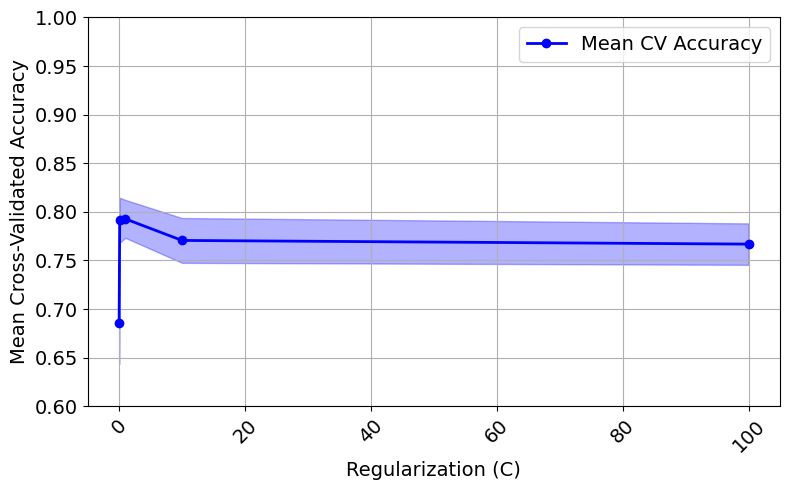

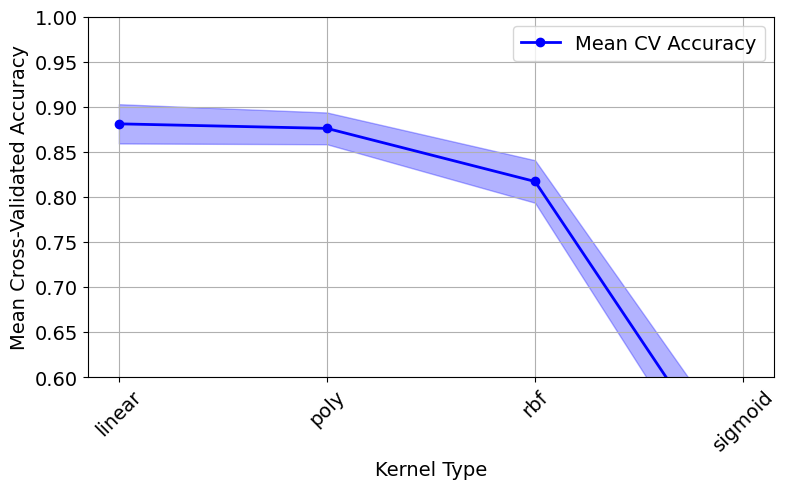

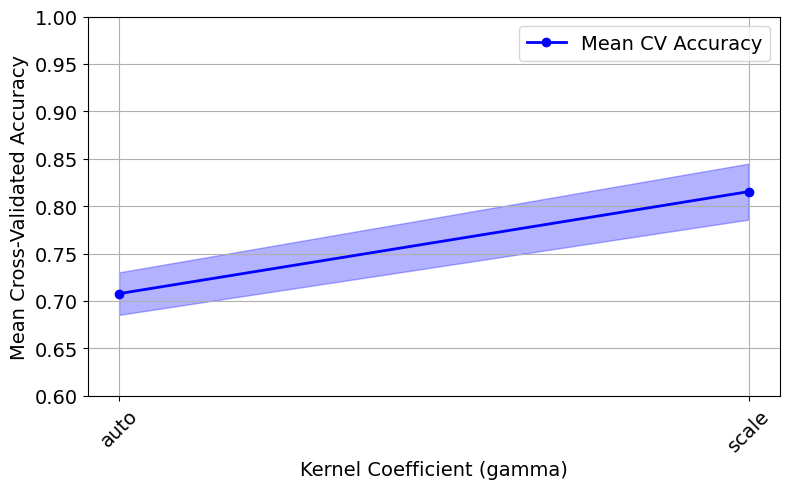

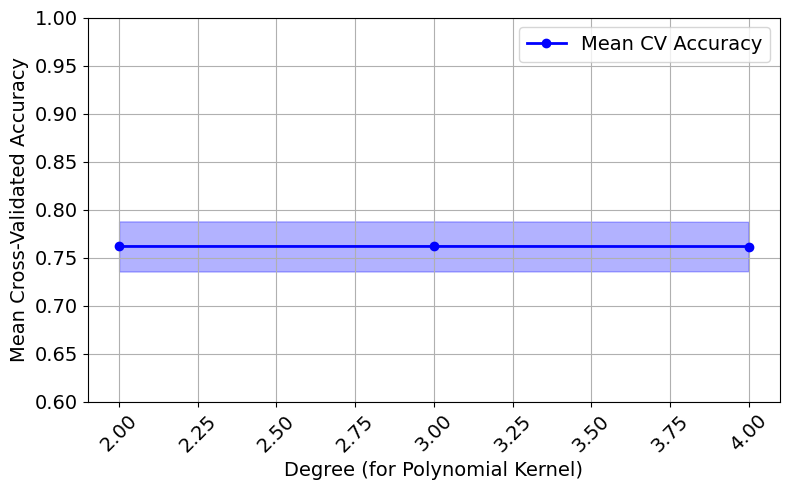

In [9]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base SVM model
svm = SVC(probability=True)

# Hyperparameter grid for tuning
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
    'gamma': ['scale', 'auto'],
    'degree': [2, 3, 4]  # Relevant only for 'poly' kernel
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=svm,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized SVM")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ---------------------- Validation Curve Plots ----------------------

# Extract GridSearchCV results
results = pd.DataFrame(grid_search.cv_results_)

# Define the parameters to plot
param_names = ['param_C', 'param_kernel', 'param_gamma', 'param_degree']

# Mapping for pretty axis labels
label_map = {
    'param_C': 'Regularization (C)',
    'param_kernel': 'Kernel Type',
    'param_gamma': 'Kernel Coefficient (gamma)',
    'param_degree': 'Degree (for Polynomial Kernel)'
}

# Loop over each parameter and generate a plot
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Convert to float if possible for proper sorting
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="blue", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="blue")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.6, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_svm_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()


Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50, 'subsample': 1.0}

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.86      0.86        76
           1       0.88      0.88      0.88        73
           2       0.86      0.87      0.87        71

    accuracy                           0.87       220
   macro avg       0.87      0.87      0.87       220
weighted avg       0.87      0.87      0.87       220



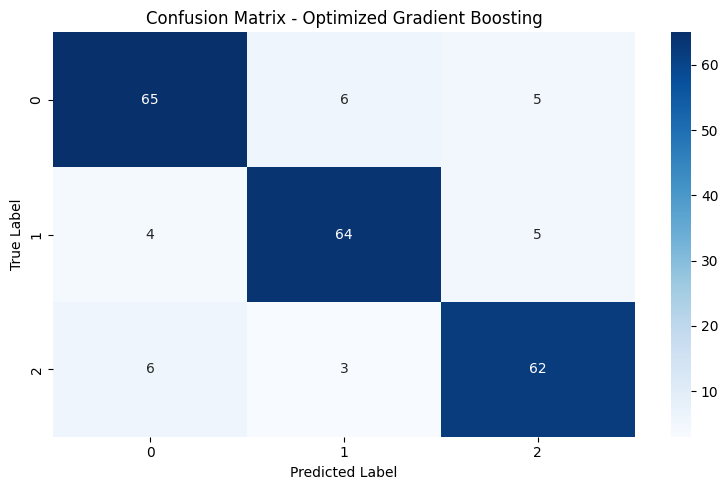

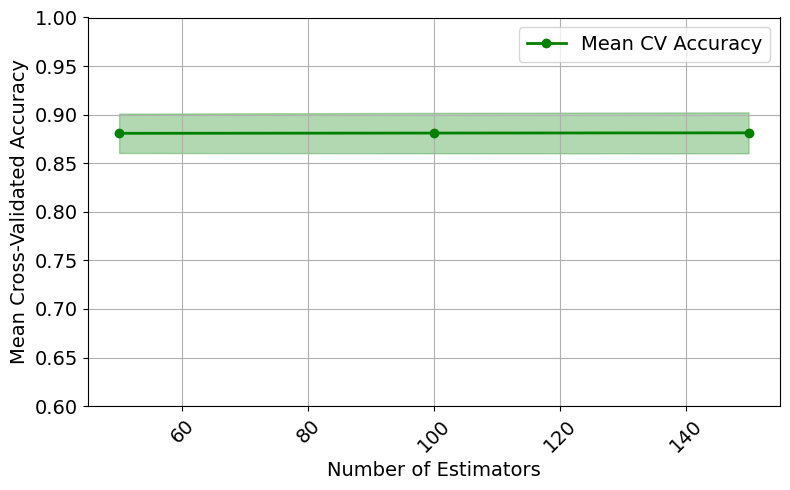

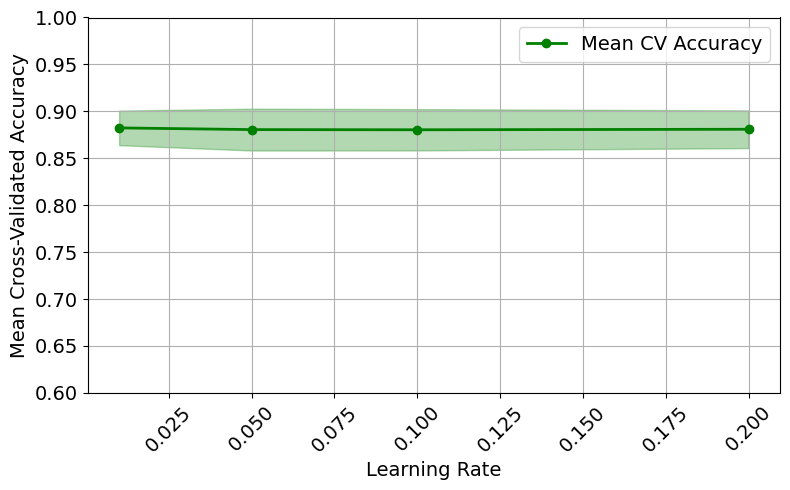

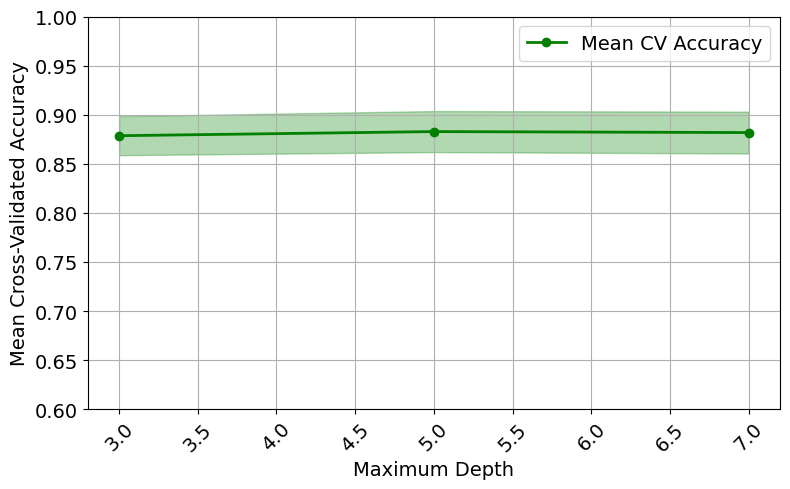

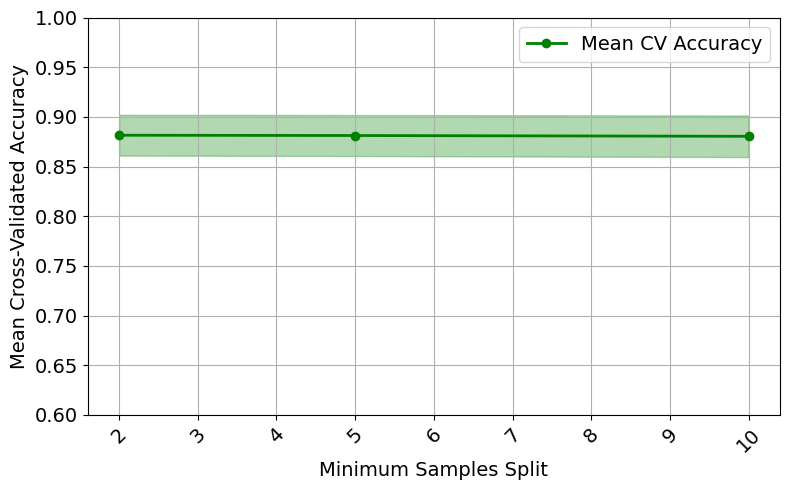

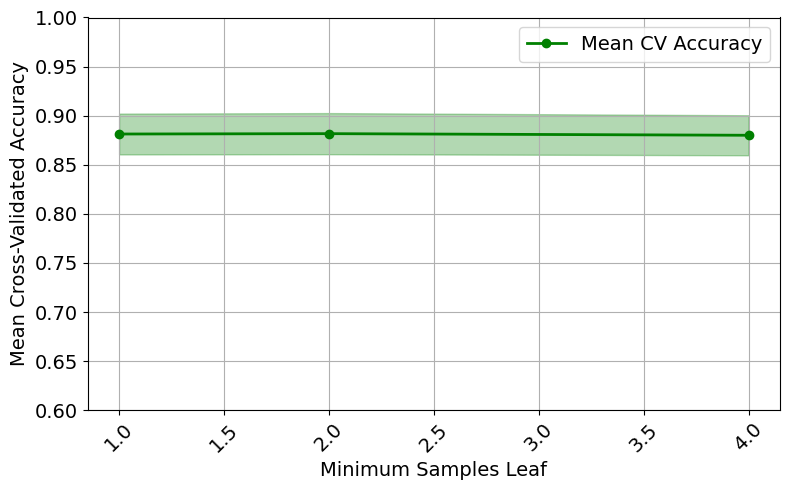

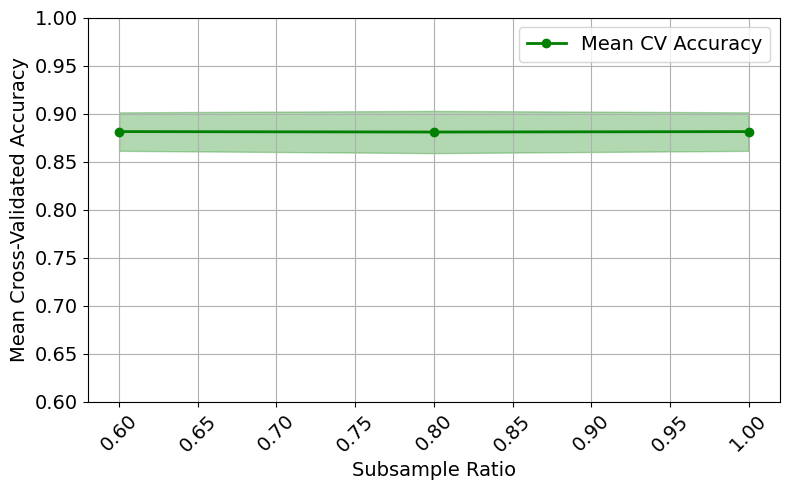

In [10]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Gradient Boosting base model
gbc = GradientBoostingClassifier(random_state=42)

# Hyperparameter grid
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.6, 0.8, 1.0]
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search setup
grid_search = GridSearchCV(
    estimator=gbc,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit model
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Prediction and evaluation
y_pred = best_model.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Gradient Boosting")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ----------------- VALIDATION CURVES -----------------

# Extract results
results = pd.DataFrame(grid_search.cv_results_)

# Parameters to visualize
param_names = [
    'param_n_estimators',
    'param_learning_rate',
    'param_max_depth',
    'param_min_samples_split',
    'param_min_samples_leaf',
    'param_subsample'
]

label_map = {
    'param_n_estimators': 'Number of Estimators',
    'param_learning_rate': 'Learning Rate',
    'param_max_depth': 'Maximum Depth',
    'param_min_samples_split': 'Minimum Samples Split',
    'param_min_samples_leaf': 'Minimum Samples Leaf',
    'param_subsample': 'Subsample Ratio'
}

# Generate one plot per hyperparameter
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Try to convert to float for proper axis ordering
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="green", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="green")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.6, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_gb_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()


Fitting 5 folds for each of 8640 candidates, totalling 43200 fits
Best Hyperparameters: {'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 15, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_samples_split': 5}

Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.91      0.87        76
           1       0.92      0.89      0.90        73
           2       0.88      0.83      0.86        71

    accuracy                           0.88       220
   macro avg       0.88      0.88      0.88       220
weighted avg       0.88      0.88      0.88       220



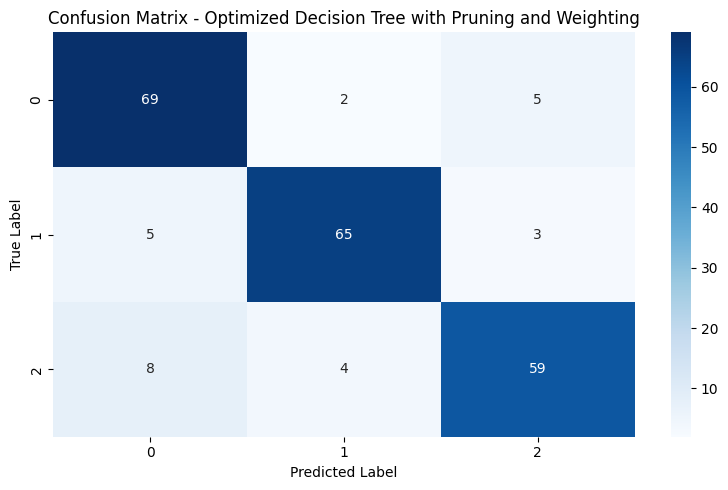

In [5]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base Decision Tree model
dtree = DecisionTreeClassifier(random_state=42)

# Define grid with cost-complexity pruning and class weights
param_grid = {
    'max_depth': [5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30],
    'criterion': ['gini', 'entropy'],
    'ccp_alpha': [0.0, 0.001, 0.01, 0.1],
    'class_weight': [None, 'balanced']
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=dtree,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Decision Tree with Pruning and Weighting")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()


Fitting 5 folds for each of 108 candidates, totalling 540 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [15:56:20] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Best Hyperparameters: {'colsample_bytree': 1.0, 'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 150, 'subsample': 0.8}

Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.87      0.87        76
           1       0.89      0.89      0.89        73
           2       0.88      0.89      0.88        71

    accuracy                           0.88       220
   macro avg       0.88      0.88      0.88       220
weighted avg       0.88      0.88      0.88       220



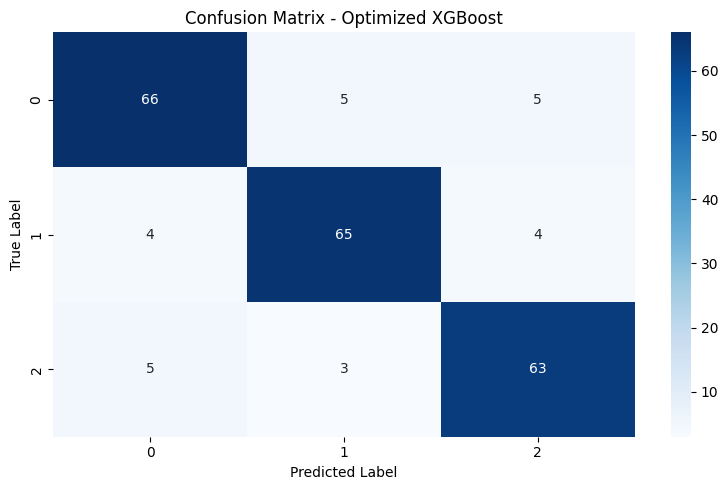

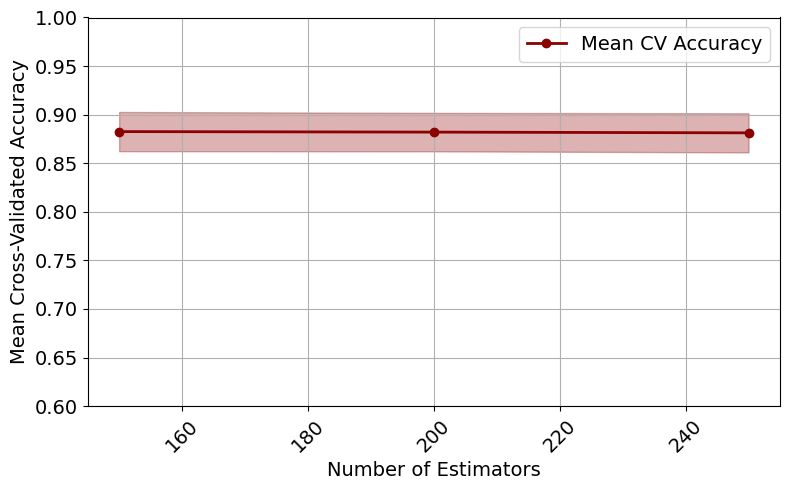

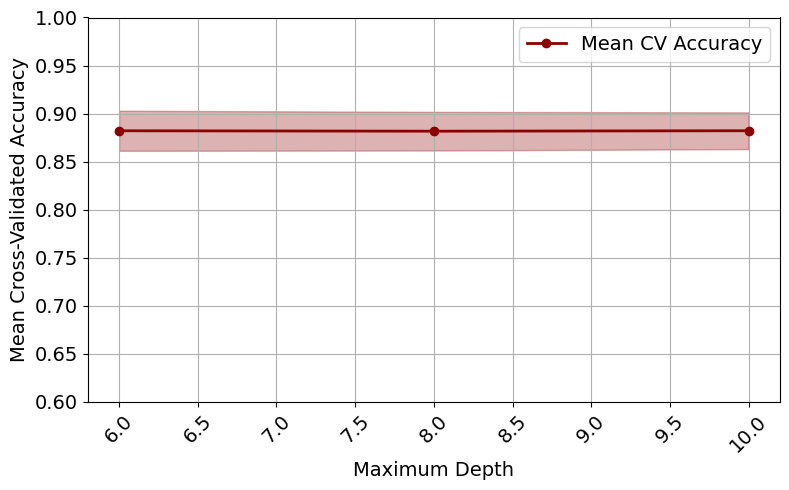

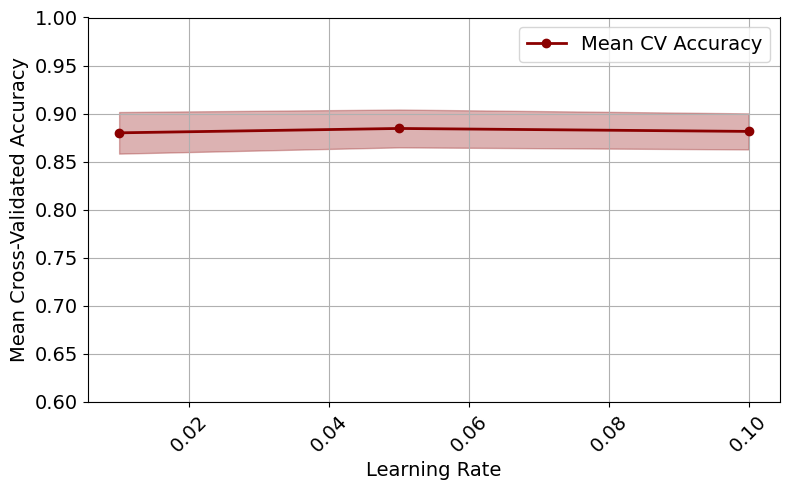

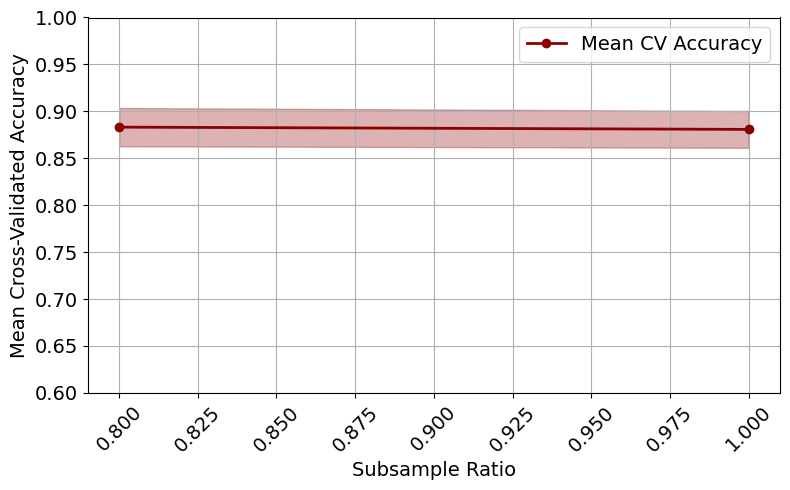

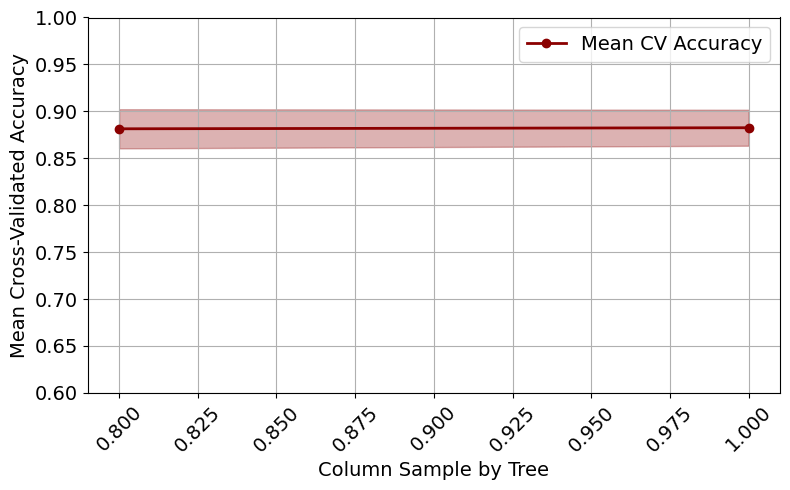

In [8]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# XGBoost base model
xgb = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Refined hyperparameter grid
param_grid = {
    'n_estimators': [150, 200, 250],
    'max_depth': [6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search setup
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit model
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Prediction and evaluation
y_pred = best_model.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized XGBoost")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ----------------- VALIDATION CURVES -----------------
results = pd.DataFrame(grid_search.cv_results_)

# Parameters to visualize
param_names = [
    'param_n_estimators',
    'param_max_depth',
    'param_learning_rate',
    'param_subsample',
    'param_colsample_bytree'
]

label_map = {
    'param_n_estimators': 'Number of Estimators',
    'param_max_depth': 'Maximum Depth',
    'param_learning_rate': 'Learning Rate',
    'param_subsample': 'Subsample Ratio',
    'param_colsample_bytree': 'Column Sample by Tree'
}

# Generate one plot per hyperparameter
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Try to convert to float for proper axis ordering
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="darkred", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="darkred")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.6, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_xgb_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()


Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Best Hyperparameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 150}

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.88      0.85        76
           1       0.93      0.88      0.90        73
           2       0.90      0.89      0.89        71

    accuracy                           0.88       220
   macro avg       0.88      0.88      0.88       220
weighted avg       0.88      0.88      0.88       220



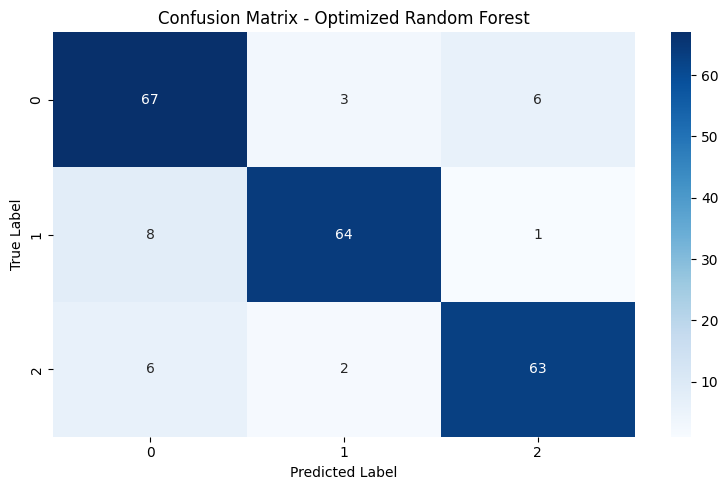

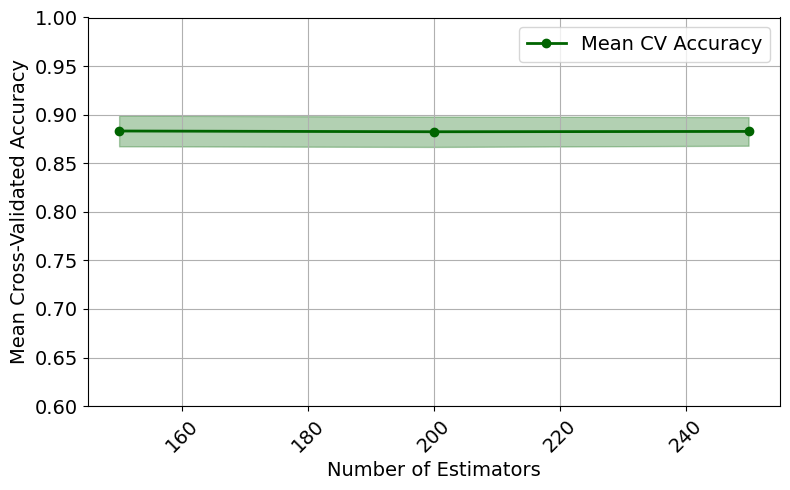

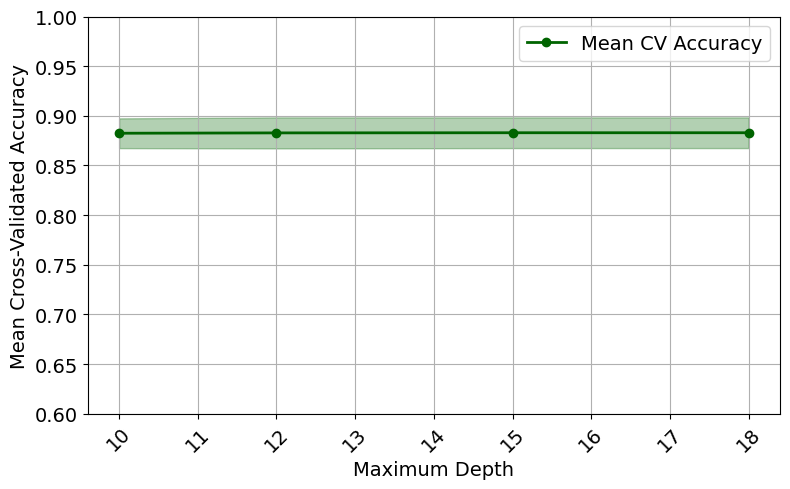

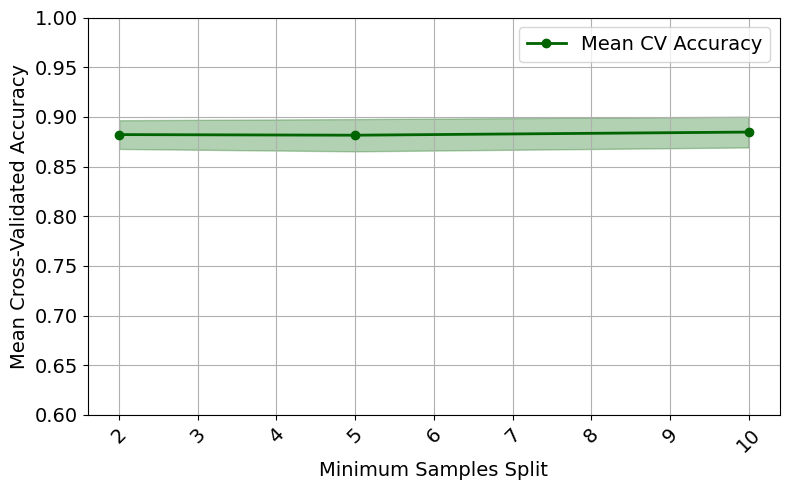

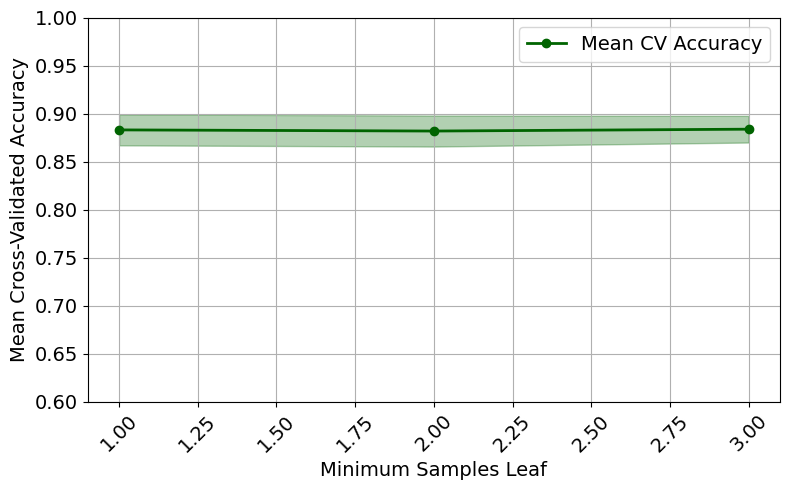

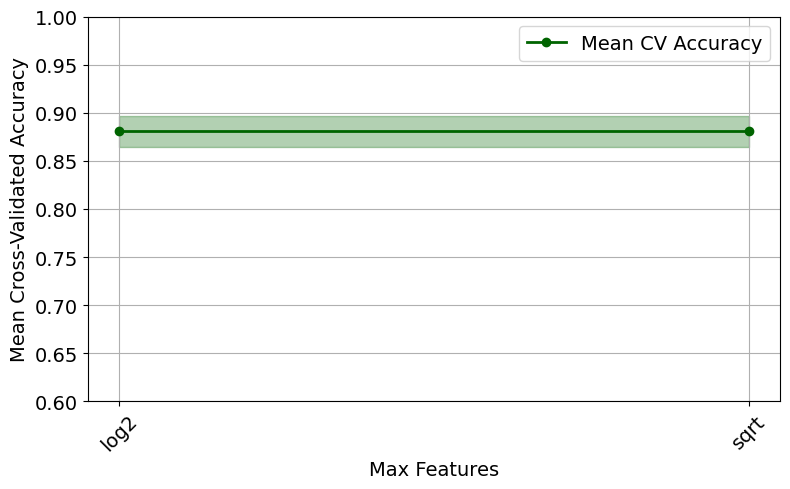

In [7]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Random Forest base model
rfc = RandomForestClassifier(random_state=42)

# Refined hyperparameter grid
param_grid = {
    'n_estimators': [150, 200, 250],
    'max_depth': [10, 12, 15, 18],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 3],
    'max_features': ['sqrt', 'log2', None]
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Grid search setup
grid_search = GridSearchCV(
    estimator=rfc,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit model
grid_search.fit(X_train, y_train)

# Best model
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Prediction and evaluation
y_pred = best_model.predict(X_test)
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Random Forest")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ----------------- VALIDATION CURVES -----------------
results = pd.DataFrame(grid_search.cv_results_)

# Parameters to visualize
param_names = [
    'param_n_estimators',
    'param_max_depth',
    'param_min_samples_split',
    'param_min_samples_leaf',
    'param_max_features'
]

label_map = {
    'param_n_estimators': 'Number of Estimators',
    'param_max_depth': 'Maximum Depth',
    'param_min_samples_split': 'Minimum Samples Split',
    'param_min_samples_leaf': 'Minimum Samples Leaf',
    'param_max_features': 'Max Features'
}

# Generate one plot per hyperparameter
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Try to convert to float for proper axis ordering
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="darkgreen", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="darkgreen")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.6, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_rf_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()



Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.88      0.86        76
           1       0.85      0.85      0.85        73
           2       0.90      0.85      0.87        71

    accuracy                           0.86       220
   macro avg       0.86      0.86      0.86       220
weighted avg       0.86      0.86      0.86       220



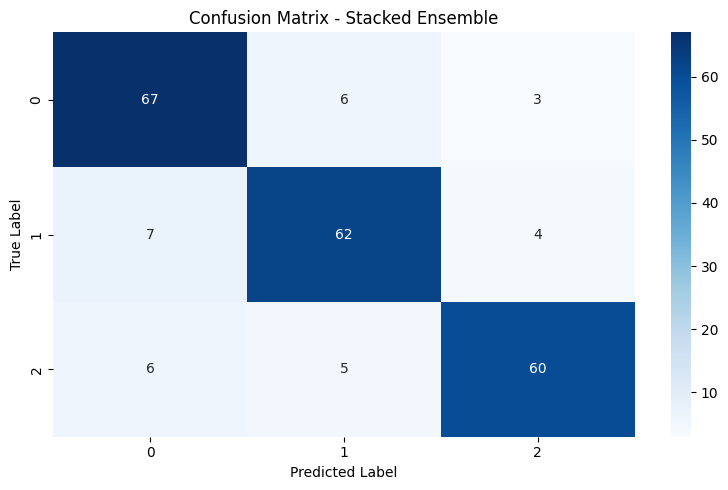

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier, GradientBoostingClassifier, RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Base learners with fine-tuned parameters
base_learners = [
    ('lr', LogisticRegression(penalty='l1', C=0.01, l1_ratio=0, solver='saga', max_iter=10000, random_state=42)),
    ('svm', SVC(C=10, kernel='linear', degree=2, gamma='scale', probability=True, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=50, learning_rate=0.01, max_depth=7,
                                      min_samples_split=2, min_samples_leaf=1, subsample=1.0, random_state=42)),
    ('dt', DecisionTreeClassifier(criterion='gini', max_depth=10, max_features='sqrt',
                                  max_leaf_nodes=None, min_samples_leaf=6, min_samples_split=20, random_state=42)),
    ('xgb', XGBClassifier(colsample_bytree=1.0, learning_rate=0.05, max_depth=6,
                          n_estimators=150, subsample=0.8, use_label_encoder=False, eval_metric='mlogloss', random_state=42))
]

# Meta-learner
meta_learner = RandomForestClassifier(max_depth=10, max_features=None, min_samples_leaf=1,
                                      min_samples_split=10, n_estimators=150, random_state=42)

# Stacking model
stacked_model = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, cv=5, n_jobs=-1, passthrough=True)

# Fit and predict
stacked_model.fit(X_train, y_train)
y_pred = stacked_model.predict(X_test)

# Evaluation
print("\nClassification Report:\n", classification_report(y_test, y_pred))
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Stacked Ensemble")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()


In [10]:
pip install shap


Fitting 5 folds for each of 120 candidates, totalling 600 fits


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
150 fits failed out of a total of 600.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
150 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1382, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 436, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.11/dist-packages/sklearn/util

Best Hyperparameters: {'C': 0.01, 'l1_ratio': 0, 'penalty': 'l1'}

Classification Report:
               precision    recall  f1-score   support

           0       0.91      0.91      0.91        76
           1       0.93      0.86      0.89        73
           2       0.86      0.92      0.88        71

    accuracy                           0.90       220
   macro avg       0.90      0.90      0.90       220
weighted avg       0.90      0.90      0.90       220



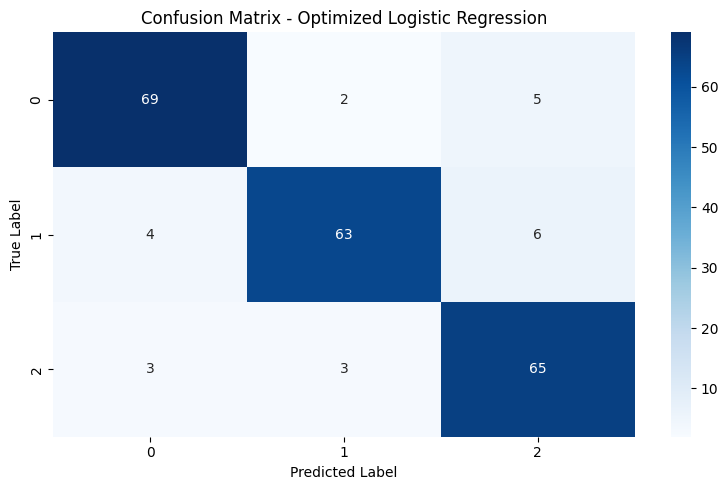

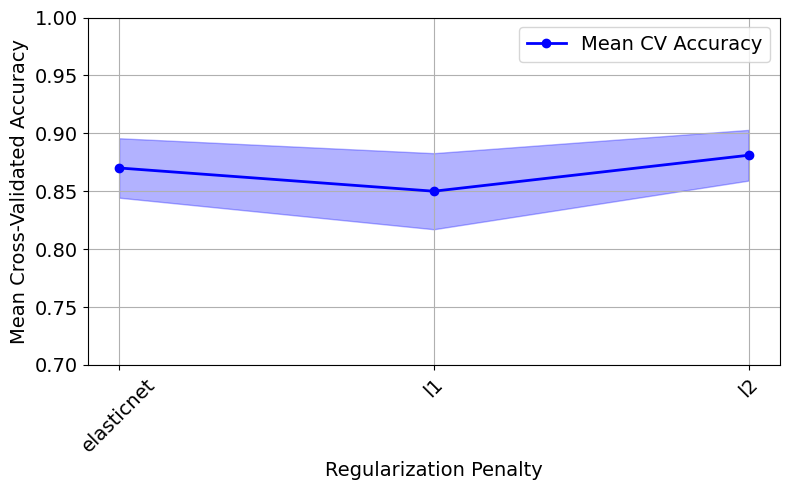

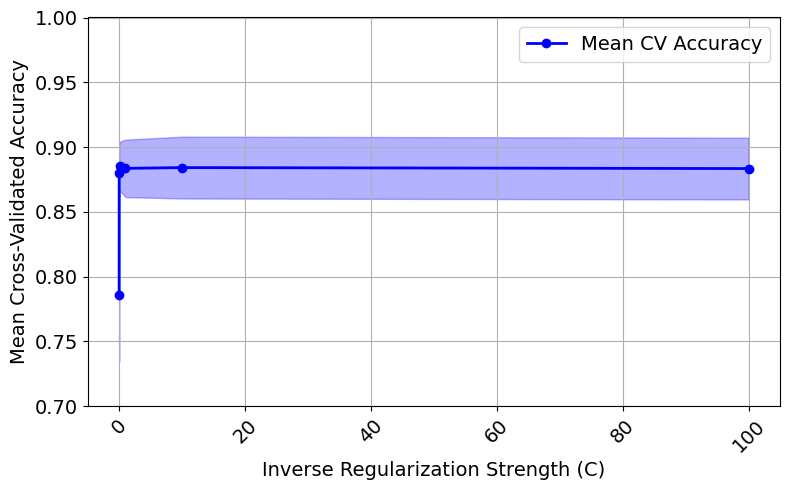

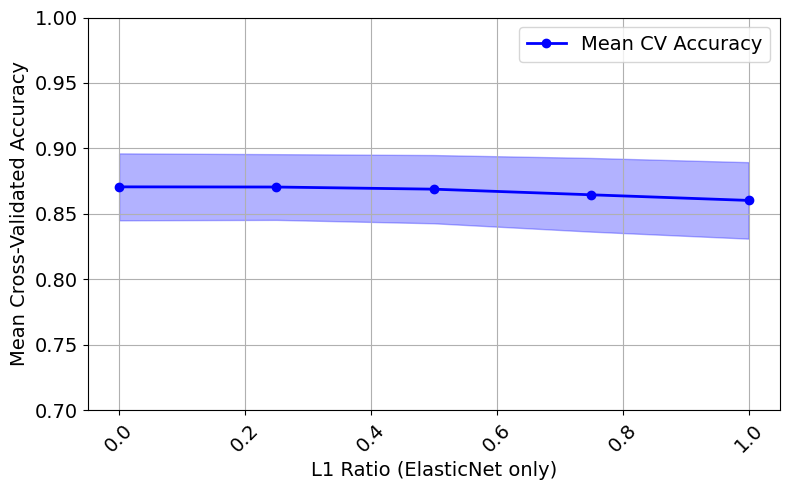

ValueError: The option feature_dependence has been renamed to feature_perturbation!

In [19]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base Logistic Regression model
logreg = LogisticRegression(solver='saga', max_iter=10000, random_state=42, multi_class='multinomial')

# Hyperparameter grid for tuning
param_grid = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'l1_ratio': [0, 0.25, 0.5, 0.75, 1],  # Only used if penalty='elasticnet'
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=logreg,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Logistic Regression")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()

# ---------------------- Validation Curve Plots ----------------------

# Extract GridSearchCV results
results = pd.DataFrame(grid_search.cv_results_)

# Define the parameters to plot
param_names = ['param_penalty', 'param_C', 'param_l1_ratio']

# Mapping for pretty axis labels
label_map = {
    'param_penalty': 'Regularization Penalty',
    'param_C': 'Inverse Regularization Strength (C)',
    'param_l1_ratio': 'L1 Ratio (ElasticNet only)'
}

# Loop over each parameter and generate a plot
for param in param_names:
    scores = results[[param, 'mean_test_score', 'std_test_score']].dropna(subset=[param])
    scores[param] = scores[param].astype(str)

    grouped = scores.groupby(param).agg(
        mean_score=('mean_test_score', 'mean'),
        std_score=('std_test_score', 'mean')
    ).reset_index()

    # Convert to float if possible for proper sorting
    grouped[param] = grouped[param].replace('None', np.nan)
    try:
        grouped[param] = grouped[param].astype(float)
    except:
        pass
    grouped = grouped.sort_values(by=param)

    # Plotting
    plt.figure(figsize=(8, 5))
    plt.plot(grouped[param], grouped['mean_score'], label="Mean CV Accuracy", color="blue", marker='o', linewidth=2, markersize=6)
    plt.fill_between(grouped[param],
                     grouped['mean_score'] - grouped['std_score'],
                     grouped['mean_score'] + grouped['std_score'],
                     alpha=0.3, color="blue")

    plt.xlabel(label_map[param], fontsize=14)
    plt.ylabel("Mean Cross-Validated Accuracy", fontsize=14)
    plt.ylim(0.7, 1.0)
    plt.xticks(rotation=45, fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)
    plt.legend(fontsize=14)
    plt.tight_layout()

    filename = f"validation_curve_logreg_{param.replace('param_', '')}.png"
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    plt.show()


# ---------------------- SHAP Analysis for Logistic Regression ----------------------

import shap

# Ensure compatibility between SHAP and Logistic Regression
explainer = shap.LinearExplainer(best_model, X_train, feature_dependence="independent")
shap_values = explainer.shap_values(X_test)

# SHAP Summary Plot - one plot for each class (since it's multinomial)
for class_idx in range(len(shap_values)):
    plt.figure()
    shap.summary_plot(shap_values[class_idx], X_test, feature_names=X.columns, show=False)
    plt.title(f'SHAP Summary Plot for Class {class_idx}')
    plt.tight_layout()
    plt.savefig(f'shap_summary_logreg_class_{class_idx}.png', dpi=300, bbox_inches='tight')
    plt.show()

# SHAP Bar Plot - average absolute impact for all classes
plt.figure()
shap.summary_plot(shap_values, X_test, feature_names=X.columns, plot_type="bar")
plt.title('SHAP Bar Plot - Feature Importance Across All Classes')
plt.tight_layout()
plt.savefig('shap_summary_logreg_bar.png', dpi=300, bbox_inches='tight')
plt.show()


<ipython-input-23-22c0b2b86e19>:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df, palette='viridis')


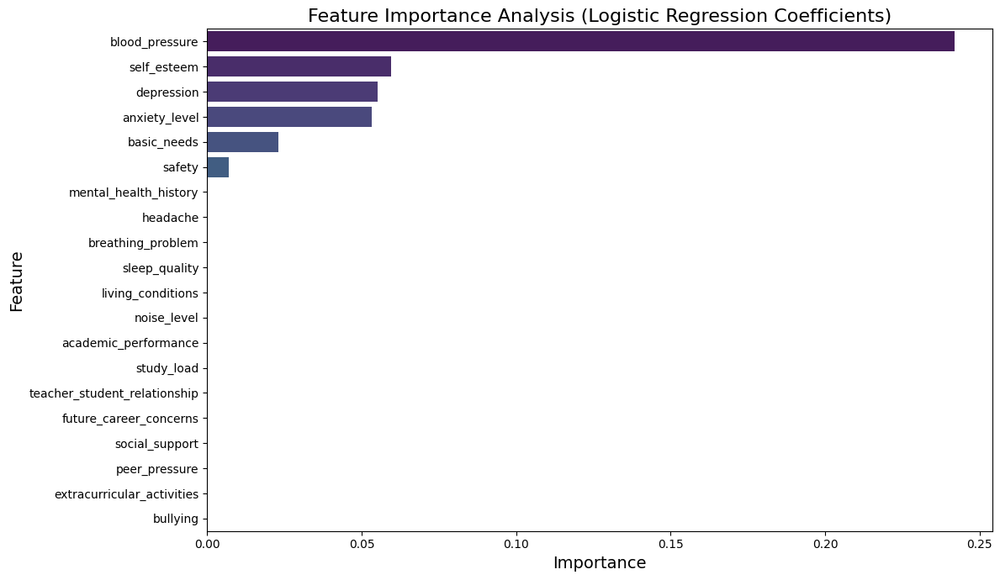

In [23]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Prepare features and target
X = df.drop(columns=['stress_level'])
y = df['stress_level']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Base Decision Tree model
dtree = DecisionTreeClassifier(random_state=42)

# Hyperparameter grid for tuning
param_grid = {
    'max_depth': [3, 5, 10, 15, 20, 25, None],
    'min_samples_split': [2, 5, 10, 15, 20],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_features': [None, 'sqrt', 'log2'],
    'max_leaf_nodes': [None, 10, 20, 30, 40],
    'criterion': ['gini', 'entropy']
}

# 5-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV setup
grid_search = GridSearchCV(
    estimator=dtree,
    param_grid=param_grid,
    cv=kf,
    scoring='accuracy',
    n_jobs=-1,
    verbose=2
)

# Fit the model
grid_search.fit(X_train, y_train)

# Best model from grid search
best_model_DT = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predict and evaluate
y_pred = best_model.predict(X_test)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix visualization
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Decision Tree")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()
plt.show()


<ipython-input-33-5c1f6dc11257>:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


<Figure size 640x480 with 0 Axes>

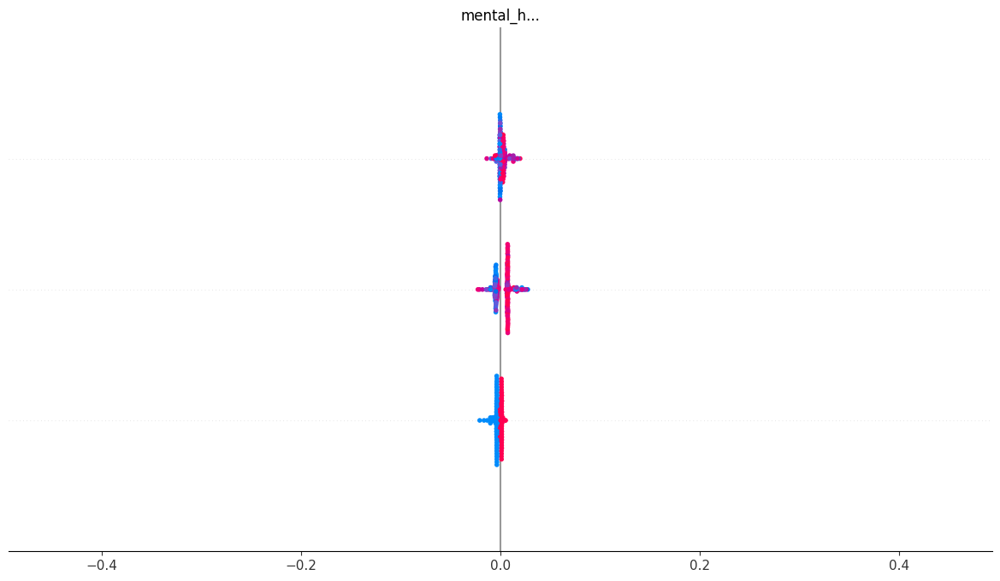

In [33]:
# Required libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Decision Tree model with specified hyperparameters
dt_model = DecisionTreeClassifier(
    criterion='gini',
    max_depth=10,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_samples_leaf=6,
    min_samples_split=20,
    random_state=42
)

# Train the model
dt_model.fit(X_train_scaled, y_train)

# Feature Importance Analysis
feature_importance = dt_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Feature Importance Plot – High-resolution and publication-ready
plt.figure(figsize=(16, 10), dpi=600)  # Larger figure size and high DPI
sns.barplot(
    x='Importance',
    y='Feature',
    data=feature_importance_df,
    palette='viridis'
)
plt.title('Feature Importance Analysis: Decision Tree', fontsize=20)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('Feature', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig("feature_importance_rf_highres.png", dpi=600)  # Optional: save as image
plt.show()

# SHAP Summary Plot – Also ready for high-resolution export
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=X.columns,
    class_names=['0', '1', '2'],
    show=True,
    plot_size=(16, 10)  # width, height in inches
)



<ipython-input-34-22ad7e7f3905>:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


<Figure size 640x480 with 0 Axes>

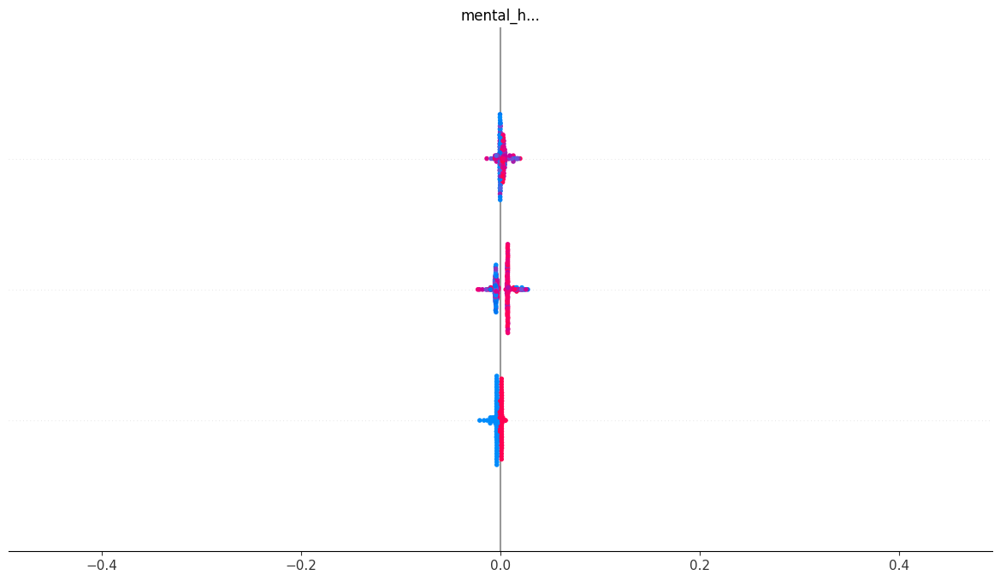

In [34]:
# Required libraries
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Separate features (X) and target variable (y)
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Random Forest model with specified hyperparameters
rf_model = RandomForestClassifier(
    max_depth=10,
    max_features=None,
    min_samples_leaf=1,
    min_samples_split=10,
    n_estimators=150,
    random_state=42
)

# Train the model
rf_model.fit(X_train_scaled, y_train)

# Feature Importance Analysis
feature_importance = rf_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

# Feature Importance Plot – High-resolution and publication-ready
plt.figure(figsize=(16, 10), dpi=600)  # Larger figure size and high DPI
sns.barplot(
    x='Importance',
    y='Feature',
    data=feature_importance_df,
    palette='viridis'
)
plt.title('Feature Importance Analysis: Random Forest', fontsize=20)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('Feature', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig("feature_importance_rf_highres.png", dpi=600)  # Optional: save as image
plt.show()

# SHAP Analysis
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test_scaled)

# SHAP Summary Plot – Also ready for high-resolution export
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=X.columns,
    class_names=['0', '1', '2'],
    show=True,
    plot_size=(16, 10)  # width, height in inches
)



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [17:40:56] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
<ipython-input-35-c3972b0ecace>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


<Figure size 640x480 with 0 Axes>

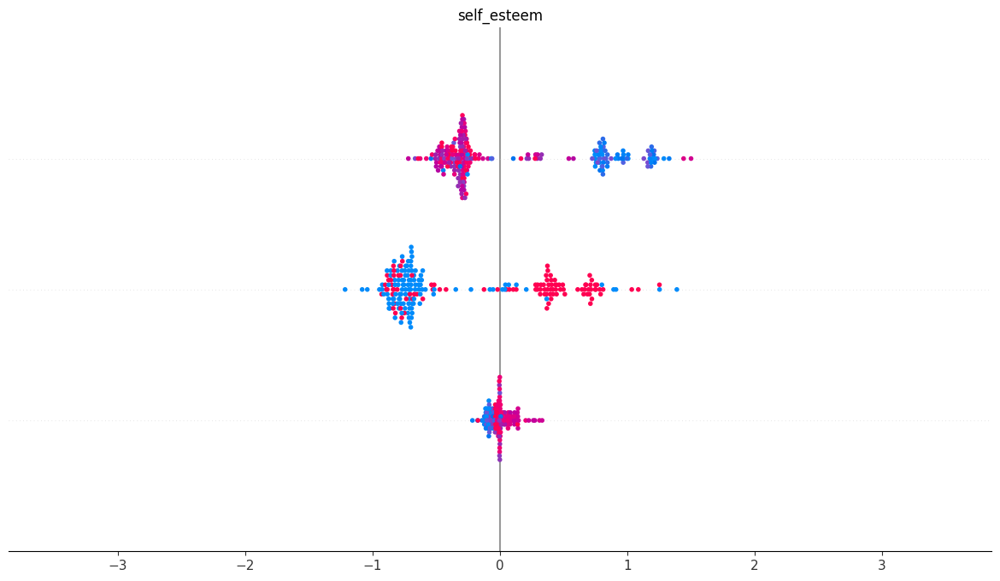

In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier, plot_importance
import matplotlib.pyplot as plt
import seaborn as sns

# Separate features and target
X = df.drop('stress_level', axis=1)
y = df['stress_level']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# Train XGBoost model with specified hyperparameters
xgb_model = XGBClassifier(
    colsample_bytree=1.0,
    learning_rate=0.05,
    max_depth=6,
    n_estimators=150,
    subsample=0.8,
    use_label_encoder=False,
    eval_metric='mlogloss',
    random_state=42
)
xgb_model.fit(X_train_scaled, y_train)

# Get feature importances by gain
importance = xgb_model.get_booster().get_score(importance_type='gain')

# Convert to DataFrame
importance_df = pd.DataFrame({
    'Feature': [X.columns[int(k[1:])] if k.startswith('f') else k for k in importance.keys()],
    'Importance': list(importance.values())
}).sort_values(by='Importance', ascending=False)

# Feature Importance Plot – High-resolution and publication-ready (XGBoost)
plt.figure(figsize=(16, 10), dpi=600)  # Larger figure size and high DPI
sns.barplot(
    x='Importance',
    y='Feature',
    data=importance_df,
    palette='viridis'
)
plt.title('Feature Importance Analysis: XGBoost Classifier', fontsize=20)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('Feature', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig("feature_importance_xgb_highres.png", dpi=600)  # Optional: save as image
plt.show()

# SHAP Analysis
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test_scaled)

# SHAP Summary Plot – Also ready for high-resolution export
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=X.columns,
    class_names=['0', '1', '2'],
    show=True,
    plot_size=(16, 10)  # width, height in inches
)



In [36]:
from sklearn.ensemble import GradientBoostingClassifier
import shap
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Train Gradient Boosting model with specified hyperparameters
gb_model = GradientBoostingClassifier(
    learning_rate=0.01,
    max_depth=7,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=50,
    subsample=1.0,
    random_state=42
)
gb_model.fit(X_train_scaled, y_train)

# Feature Importance Plot – High-resolution and publication-ready (GB)
feature_importance = gb_model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importance
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(16, 10), dpi=600)
sns.barplot(
    x='Importance',
    y='Feature',
    data=feature_importance_df,
    palette='viridis'
)
plt.title('Feature Importance Analysis: Gradient Boosting', fontsize=20)
plt.xlabel('Importance', fontsize=18)
plt.ylabel('Feature', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.tight_layout()
plt.savefig("feature_importance_gb_highres.png", dpi=600)
plt.show()

# SHAP Analysis
explainer = shap.Explainer(gb_model, X_train_scaled)
shap_values = explainer(X_test_scaled)

# SHAP Summary Plot – High-resolution export
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=X.columns,
    class_names=['0', '1', '2'],
    show=True,
    plot_size=(16, 10)
)


<ipython-input-36-09bdff0e863d>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: GradientBoostingClassifier(learning_rate=0.01, max_depth=7, n_estimators=50,
                           random_state=42)